RFE NEE

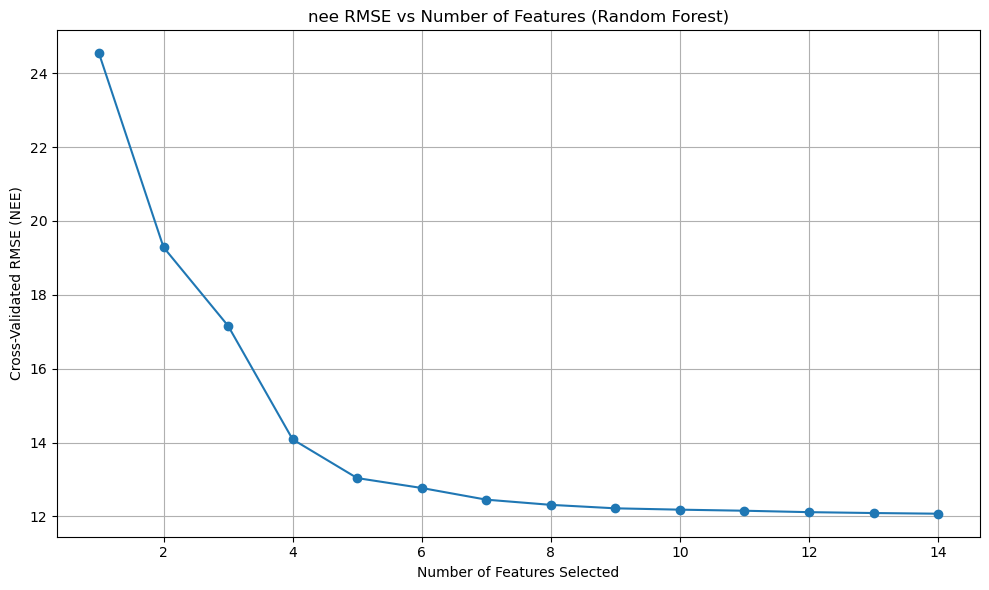

Optimal number of features: 1
Selected features: ['tmean_C']


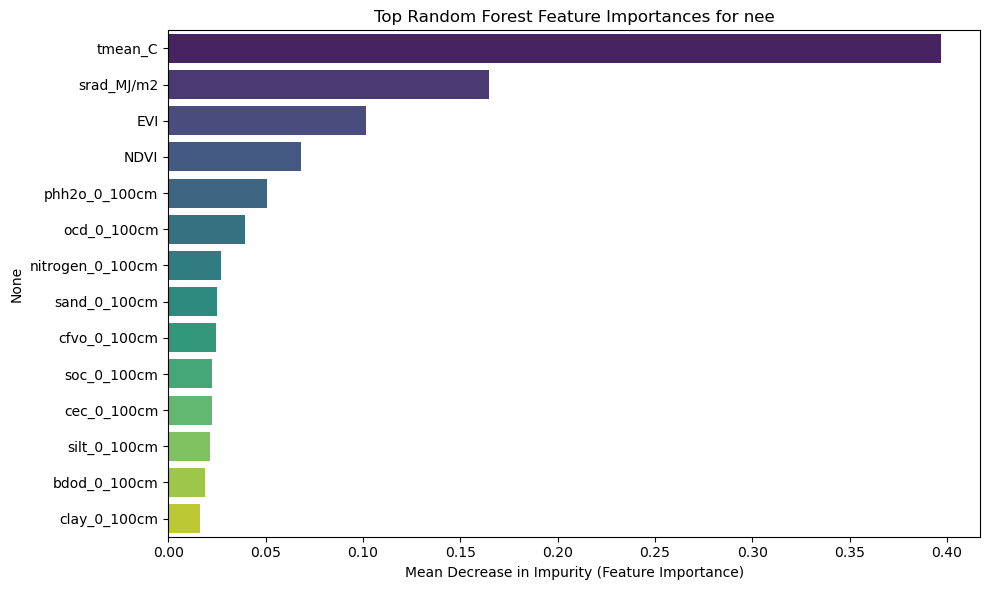

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')


# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'nee'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

RFE GPP

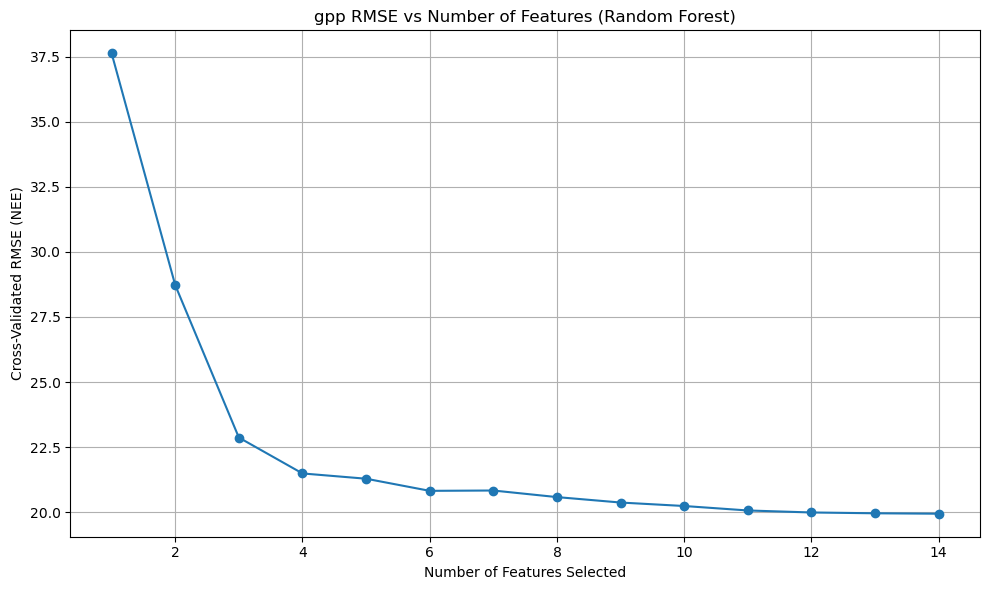

Optimal number of features: 1
Selected features: ['tmean_C']


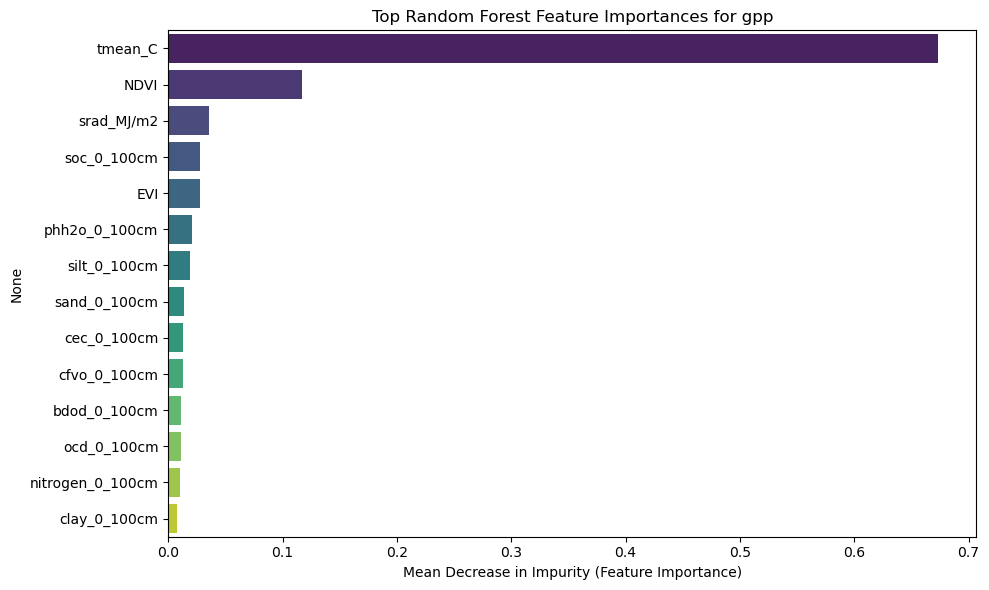

In [24]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'gpp'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

RFE RECO

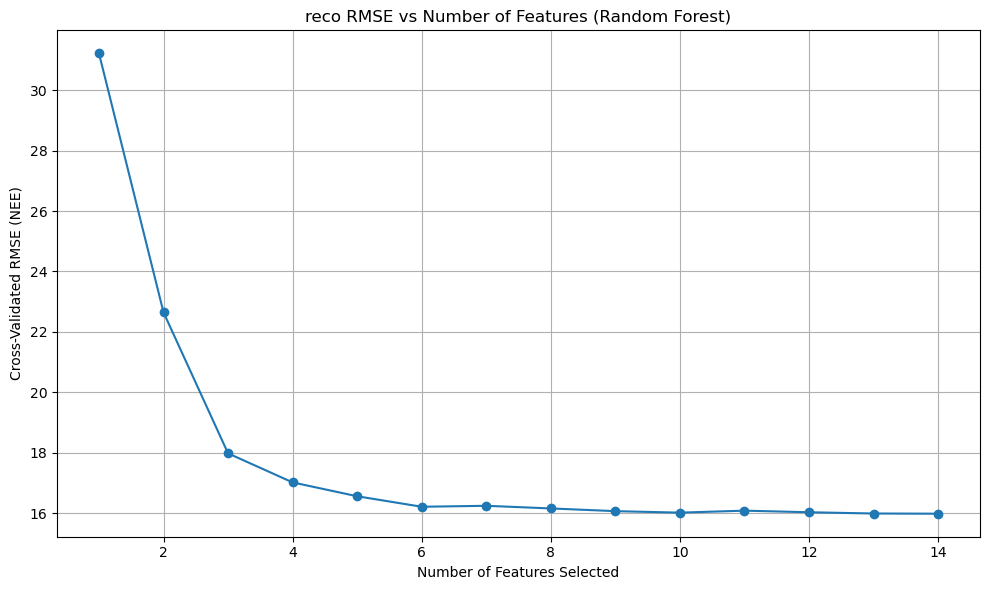

Optimal number of features: 1
Selected features: ['tmean_C']


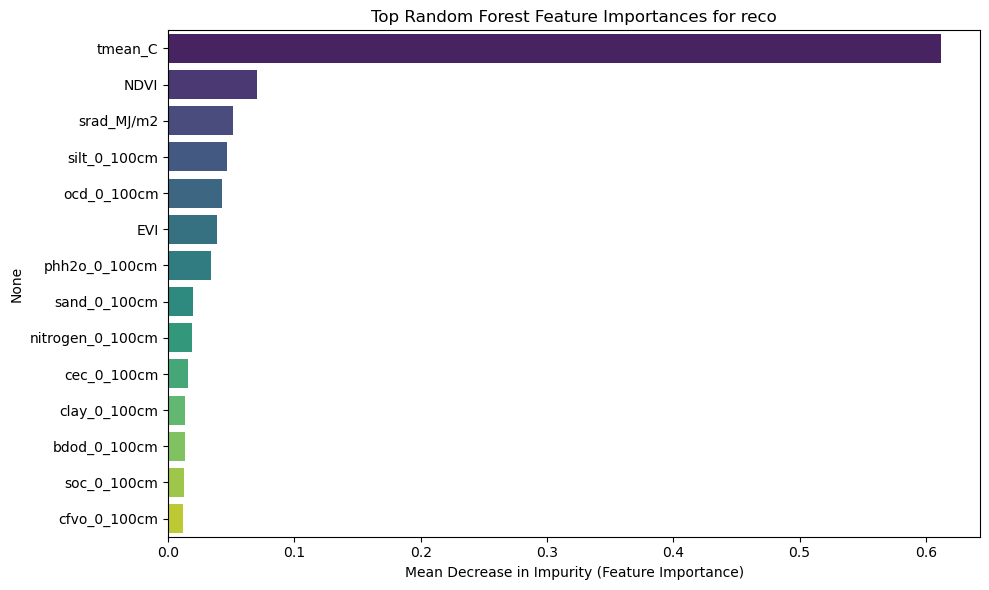

In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'reco'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

RFE CH4

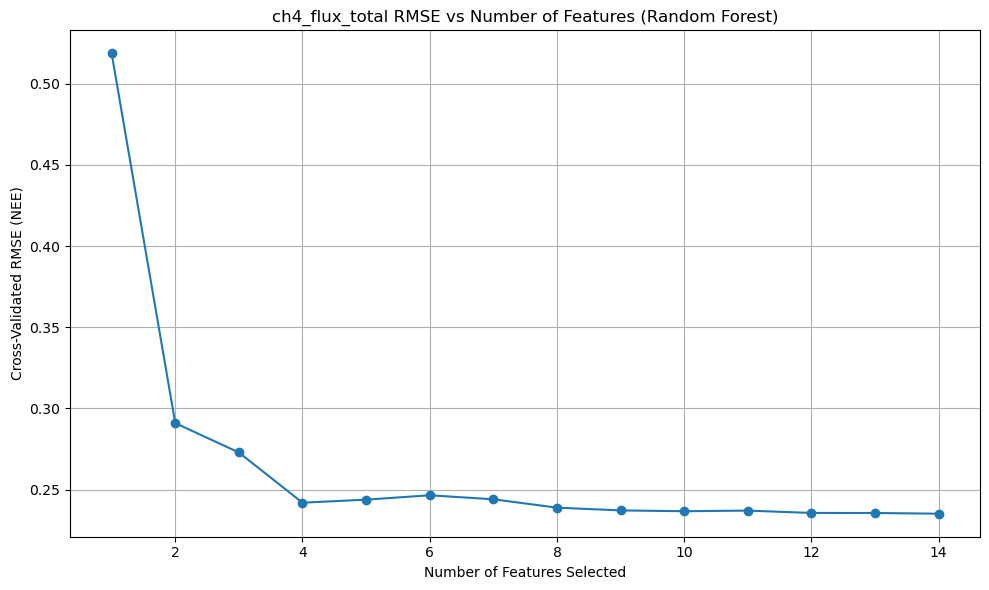

Optimal number of features: 1
Selected features: ['soc_0_100cm']


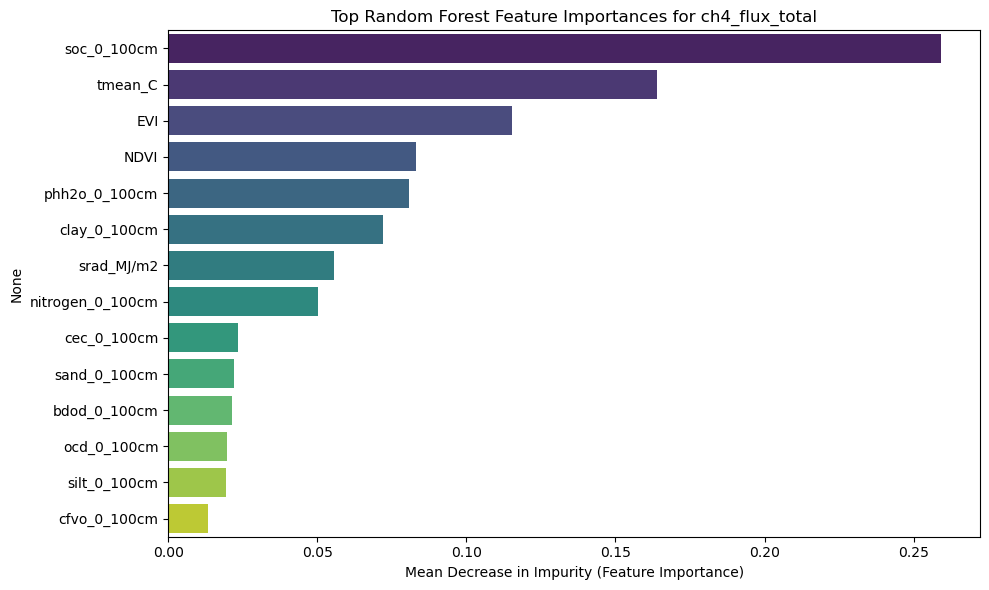

In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')


# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'ch4_flux_total'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

GPP 10-fold CV XGboost no dummy variables for LC

In [27]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer
import warnings
# warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=FutureWarning)
# 1. Load and prepare the data
# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']

target_var = 'gpp'

# 3. Drop NA
df_model = df[predictor_vars + [target_var]].dropna()
X = df_model[predictor_vars]
y = df_model[target_var]

# 4. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 5. Initialize model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 6. Grid search for RMSE
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)

grid_search.fit(X, y)
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_

print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 7. Cross-validated R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 8. Cross-validated MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 17.893
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.924 ± 0.018
✅ 10-Fold CV MAE: 9.256 ± 0.607


GPP 10-fold CV XGboost dummy variables for LC

In [28]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'gpp'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 17.860
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.925 ± 0.016
✅ 10-Fold CV MAE: 9.241 ± 0.816


                                                 Site       RMSE        MAE   
0   Manitoba - Northern Old Black Spruce (former B...  35.034354  19.342239  \
1   Saskatchewan - Western Boreal, Mature Aspen_CA...  86.947915  50.975361   
2   Saskatchewan - Western Boreal, Mature Black Sp...  20.651087  16.068720   
3                     UCI-1930 burn site_CA-NS2_tower  36.148686  22.935748   
4                     UCI-1964 burn site_CA-NS3_tower  33.134985  25.866517   
..                                                ...        ...        ...   
93                   Stordalen Palsa Bog_SE-Sto_tower  16.339790  13.985969   
94                        Iqaluit Tundra_CA-IQ1_tower  16.085779  10.782822   
95  Plotnikovo field station, Tomsk, Rusia_RU-Plt_...  18.294113  14.542028   
96                                Igarka_RU-Iga_tower  70.968546  57.305077   
97                       Churchill Fen 3_CA-CF3_tower  18.283088  14.818963   

          R2  
0   0.779221  
1   0.551901  
2   0.

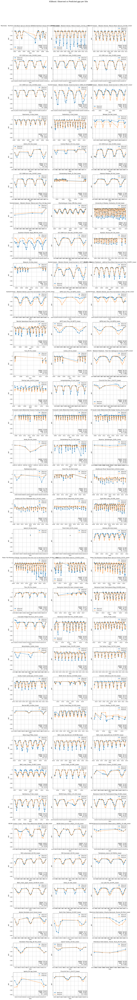

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'gpp'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)

# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.98, 0.05, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )


# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alts.png'))
plt.show()


NEE 10-fold CV XGboost dummy variables for LC

In [30]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'nee'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 11.236
✅ Best Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.862 ± 0.024
✅ 10-Fold CV MAE: 6.120 ± 0.435


                                                  Site       RMSE        MAE   
0    Manitoba - Northern Old Black Spruce (former B...  17.495212  11.535607  \
1    Saskatchewan - Western Boreal, Mature Aspen_CA...  47.827482  35.867590   
2    Saskatchewan - Western Boreal, Mature Black Sp...  15.225794  11.014119   
3    Saskatchewan - Western Boreal, Mature Jack Pin...  22.465447  18.137450   
4                      UCI-1930 burn site_CA-NS2_tower  33.215701  22.501999   
..                                                 ...        ...        ...   
111                     North Star Yedoma_US-NSY_tower  40.585668  30.691674   
112                                Lutose_CA-LUT_tower  11.520656   8.774325   
113                        Iqaluit Tundra_CA-IQ1_tower  13.713927  10.178290   
114  Plotnikovo field station, Tomsk, Rusia_RU-Plt_...  13.071260  10.441892   
115                       Churchill Fen 3_CA-CF3_tower   9.613222   8.452367   

           R2  
0    0.409717  
1    0.

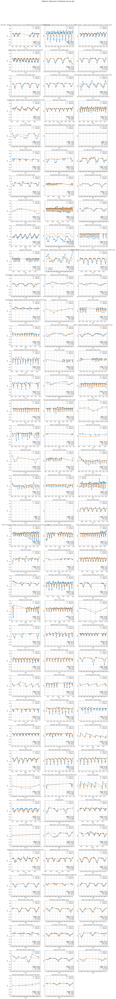

In [31]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'nee'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.98, 0.05, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


RECO 10-fold CV XGboost dummy variables for LC

In [32]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars =['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'reco'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 14.616
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.903 ± 0.016
✅ 10-Fold CV MAE: 7.720 ± 0.331


                                                 Site       RMSE        MAE   
0   Manitoba - Northern Old Black Spruce (former B...  49.247254  25.344741  \
1   Saskatchewan - Western Boreal, Mature Aspen_CA...  42.608941  33.381524   
2   Saskatchewan - Western Boreal, Mature Black Sp...  15.410125  11.175243   
3   Saskatchewan - Western Boreal, Mature Jack Pin...  16.103167  10.868408   
4                     UCI-1930 burn site_CA-NS2_tower  22.701950  18.812962   
..                                                ...        ...        ...   
94  Mukhrino field station, Khanty-Mansiysk, Russi...  46.549501  39.547942   
95                        Iqaluit Tundra_CA-IQ1_tower   7.908981   6.548683   
96  Plotnikovo field station, Tomsk, Rusia_RU-Plt_...  23.164985  20.630199   
97                                Igarka_RU-Iga_tower  82.739573  68.478379   
98                       Churchill Fen 3_CA-CF3_tower  16.888111  14.955009   

          R2  
0   0.450984  
1   0.674281  
2   0.

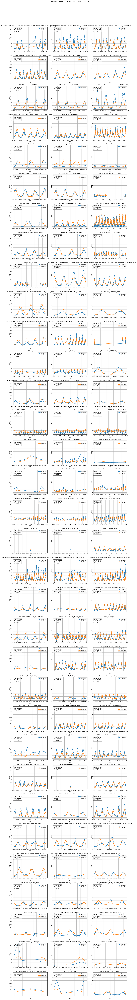

In [33]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'reco'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.02, 0.95, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='top',
        horizontalalignment='left',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


CH4 10-fold CV XGboost dummy variables for LC

In [34]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']

target_var = 'ch4_flux_total'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 0.185
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.938 ± 0.033
✅ 10-Fold CV MAE: 0.066 ± 0.016


                                                 Site      RMSE       MAE   
0                        Kytalyk, Russia_RU-Cok_tower  0.320725  0.281019  \
1                          Lompolojankka_FI-Lom_tower  1.365754  0.966108   
2                                   Rylekaerene_tower  1.686588  1.275807   
3                                  Seida_RU-Vrk_tower  0.957935  0.876250   
4                   Churchill Fen Site 2_CA-CF2_tower  0.576488  0.458840   
5        University of Alaska, Fairbanks_US-Uaf_tower  0.303806  0.271851   
6                     Trail Valley Creek_CA-TVC_tower  0.446210  0.420978   
7                 Scotty Creek Landscape_CA-SCC_tower  0.429025  0.362968   
8                     NGEE Arctic Barrow_US-NGB_tower  0.265678  0.196262   
9                     Cherskii reference_RU-Ch2_tower  0.737704  0.532557   
10                                Ivotuk_US-Ivo_tower  0.376397  0.275387   
11                            Barrow-BES_US-Bes_tower  0.334885  0.251437   

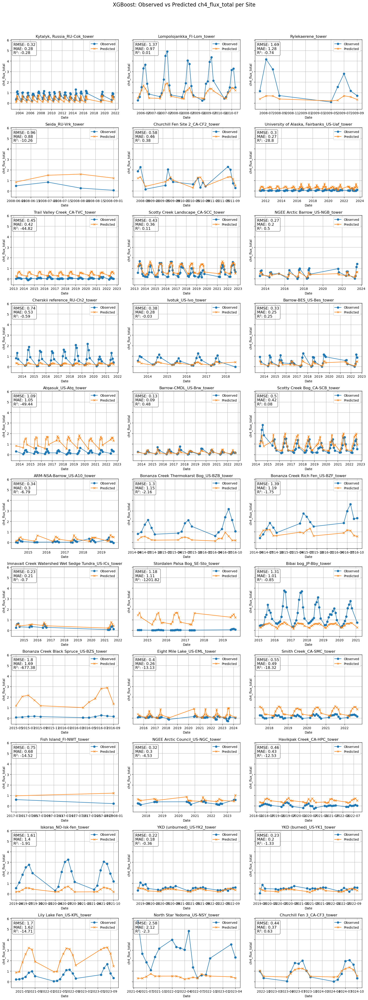

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil_alt.csv")  

# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'ch4_flux_total'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.02, 0.95, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='top',
        horizontalalignment='left',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


In [37]:
input_data = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data.csv")

input_data

,site_reference,latitude,longitude,land_cover_eco,bawld_class,month,year,EVI,NDVI,srad_MJ/m2,tmax_C,tmin_C,soc,nee,gpp,reco,ch4_flux_total
0,Bernard spruce-moss valley_tower,50.902100,-63.405102,70.0,Boreal Forest,1,2002,NaN,NaN,52.3,-11.6,-23.1,782.0,NaN,NaN,NaN,NaN
1,Umiujaq_tower,56.556557,-76.482340,120.0,Dry Tundra,1,2002,NaN,NaN,33.1,-18.7,-26.6,621.0,NaN,NaN,NaN,NaN
2,Attawapiskat River Bog_CA-ARB_tower,52.695000,-83.945200,180.0,Bog,1,2002,NaN,NaN,44.2,-15.2,-26.3,2889.0,NaN,NaN,NaN,NaN
3,Attawapiskat River Fen_CA-ARF_tower,52.700800,-83.955000,160.0,Fen,1,2002,NaN,NaN,44.2,-15.2,-26.3,2275.0,NaN,NaN,NaN,NaN
4,Bouleau peatland_CA-BOU_tower,50.516667,-63.200000,180.0,Bog,1,2002,NaN,NaN,53.3,-10.4,-21.5,520.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62203,NEON Caribou Creek - Poker Flats Watershed (BO...,65.154000,-147.502600,70.0,Boreal Forest,12,2024,NaN,NaN,1.8,-10.6,-16.5,1018.0,NaN,NaN,NaN,NaN
62204,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,-11.0,-18.8,506.0,NaN,NaN,NaN,NaN
62205,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,-11.0,-18.8,506.0,NaN,NaN,NaN,NaN
62206,NEON Healy (HEAL)_US-xHE_tower,63.875700,-149.213300,120.0,Dry Tundra,12,2024,NaN,NaN,2.9,-6.1,-13.6,894.0,NaN,NaN,NaN,NaN
